In [37]:
import json 
import numpy as np
import matplotlib.pyplot as plt
from collections import defaultdict
import cv2
from datetime import datetime

In [38]:
with open("homo_kafka/kafka_messages_full_area.json","r", encoding="utf-8") as f:
    data = json.load(f)

print(data[:1000])

[{'timestamp': '2026-01-15T14:22:50.277000+00:00', 'partition': 0, 'offset': 976763, 'value': {'cam_231': {'area': [1], 'bboxes': [[849.3333740234375, 213.1875, 924.6666870117188, 318.75], [946.6666870117188, 167.53125, 1082.666748046875, 261.1875]], 'dewrap_view': ['view2', 'view3'], 'fisheye_positions_x_y': [[1981.24609375, 1214.552001953125], [2016.1671142578125, 1102.35107421875]], 'frame_id': '25122', 'heading_angle': [999.0, 356.2701110839844], 'object_area': [1, 1], 'object_association_ids': [0, 1], 'object_classes': ['person', 'forklift'], 'object_confidences': [0.91357421875, 0.96142578125], 'object_ids': [360, 175], 'object_positions_x_y': [[581.543701171875, 1320.96044921875], [391.8336486816406, 1321.734375]], 'timestamp': '2026-01-15 15:22:50.276', 'vest_flags': [False, False]}}}, {'timestamp': '2026-01-15T14:22:50.284000+00:00', 'partition': 0, 'offset': 976764, 'value': {'cam_229': {'area': [1], 'bboxes': [[64.16667175292969, 269.4375, 665.0, 706.5], [513.0, 207.75, 622.

In [157]:
# Kafka message filter
fisheye_cam_id = ["cam_229", "cam_233","cam_234","cam_231"]
fisheye_data = {cam:[] for cam in fisheye_cam_id}
def parse_ts(ts_str):
    return datetime.fromisoformat(ts_str.replace("Z", "+00:00"))
def area_bbox(position_bbox):
    x1,y1,x2,y2 = position_bbox
    width  = x2 - x1
    height = y2 - y1
    return width * height
def aspect_ratio_bbox(position_bbox):
    x1, y1, x2, y2 = position_bbox
    width = x2 - x1
    height = y2 - y1

    if height == 0:
        return None  # avoid division by zero

    return width / height
     
pair = []
for i in fisheye_cam_id:
    for j in fisheye_cam_id:
        if i == j:
            continue
        if (j,i) not in pair:
            pair.append((i,j))
            
for msg in data:
    kafka_ts = msg.get("timestamp")
    value = msg.get("value", {})

    for cam_id, cam in value.items():
        if cam_id not in fisheye_cam_id:
            continue

        classes = cam.get("object_classes", [])
        positions = cam.get("fisheye_positions_x_y", [])
        vest_flags = cam.get("vest_flags",[])
        bboxes = cam.get("bboxes",[])


        for i, condition_vest in enumerate(vest_flags):
            if condition_vest:
                cls = classes[i] 
                if cls == "person" and i < len(positions):
                    entry = {
                        "camera": cam_id,
                        "frame_id": cam.get("frame_id"),
                        "position": positions[i],
                        "camera_timestamp": cam.get("timestamp"),
                        "area_bbox": area_bbox(bboxes[i]),
                        "aspect_ratio_bbox": aspect_ratio_bbox(bboxes[i]),
                        "kafka_timestamp_ms": int(
                            datetime.fromisoformat(kafka_ts.replace("Z","+00:00"))
                            .timestamp() * 1000)
                    }

                    fisheye_data[cam_id].append(entry)

# Processing
def undistort_points(pts, K_fish, D_fish, K_rect):
    pts = np.asarray(pts, np.float32).reshape(-1, 1, 2)
    out = cv2.fisheye.undistortPoints(pts, K_fish, D_fish, P=K_rect)
    return out.reshape(-1, 2)
fisheye_params = {
    "width": 2592, "height": 1944,
    "cx": 1296.0, "cy": 972.0,
    "radius": 952.56, "theta_max_rad": 1.5708
}

rect_w, rect_h = 2560, 2560
fov = 160  
focal = (rect_w / 2) / np.tan(np.deg2rad(fov) / 2)

K_rect = np.array([[focal, 0, rect_w/2],
                   [0, focal, rect_h/2],
                   [0, 0, 1]], np.float32)

f_fish = fisheye_params["radius"] / fisheye_params["theta_max_rad"]
K_fish = np.array([[f_fish, 0, fisheye_params["cx"]],
                   [0, f_fish, fisheye_params["cy"]],
                   [0, 0, 1]], np.float32)

D_fish = np.zeros((4, 1), np.float32)

TOL_MS = 10
MIN_EDGE_DIST = 40
undistorted_pair_points = {}
undistorted_pair_points_gt = {}
for p in pair:
    a,b = p
    fisheye_a_common = []
    fisheye_b_common = []

    fisheye_a_sorted = sorted(fisheye_data[a], key=lambda x: x["kafka_timestamp_ms"])
    fisheye_b_sorted = sorted(fisheye_data[b], key=lambda x: x["kafka_timestamp_ms"])
    i, j = 0, 0
    while i < len(fisheye_a_sorted) and j < len(fisheye_b_sorted):
        ts_a = fisheye_a_sorted[i]["kafka_timestamp_ms"]
        ts_b = fisheye_b_sorted[j]["kafka_timestamp_ms"]

        if abs(ts_a - ts_b) <= TOL_MS:
            fisheye_a_common.append(fisheye_a_sorted[i])
            fisheye_b_common.append(fisheye_b_sorted[j])
            i += 1
            j += 1
        elif ts_a < ts_b:
            i += 1
        else:
            j += 1

    print(f"Matched pairs {a} - {b}".format(TOL_MS, len(fisheye_a_common)))

    pts_a = np.array([d["position"] for d in fisheye_a_common],dtype=np.float32)
    pts_b = np.array([d["position"] for d in fisheye_b_common],dtype=np.float32)
    pts_a_ua = undistort_points(pts_a, K_fish, D_fish, K_rect)
    pts_b_ub = undistort_points(pts_b, K_fish, D_fish, K_rect)
    key = f"pair_{a.split('_')[1]}_{b.split('_')[1]}"
    undistorted_pair_points_gt[key] = [pts_a_ua.tolist(), pts_b_ub.tolist()]
    hull_a_idx = set(cv2.convexHull(pts_a, returnPoints=False).squeeze().tolist())
    hull_b_idx = set(cv2.convexHull(pts_b, returnPoints=False).squeeze().tolist())
    common_idx = sorted(hull_a_idx & hull_b_idx)
    print("Polygon points:", len(common_idx))
    pts_a_final = pts_a[common_idx]
    pts_b_final = pts_b[common_idx]

    def ccw_order_indices(pts):
        center = np.mean(pts, axis=0)
        angles = np.arctan2(
            pts[:, 1] - center[1],
            pts[:, 0] - center[0]
        )
        return np.argsort(angles)

    order = ccw_order_indices(pts_a_final)

    pts_a_final = pts_a_final[order]
    pts_b_final = pts_b_final[order]
    keep = [0]
    for i in range(1, len(pts_a_final)):
        dist_a = np.linalg.norm(pts_a_final[i] - pts_a_final[keep[-1]])
        dist_b = np.linalg.norm(pts_b_final[i] - pts_b_final[keep[-1]])

        if dist_a >= MIN_EDGE_DIST and dist_b >= MIN_EDGE_DIST:
            keep.append(i)


    pts_a_final = pts_a_final[keep]
    pts_b_final = pts_b_final[keep]
    print("Final polygon points:", (pts_b_final.shape[0]))
    assert pts_a_final.shape == pts_b_final.shape
    assert pts_a_final.shape[0] >= 4
    ua = undistort_points(pts_a_final, K_fish, D_fish, K_rect)
    ub = undistort_points(pts_b_final, K_fish, D_fish, K_rect)
    key = f"pair_{a.split('_')[1]}_{b.split('_')[1]}"
    undistorted_pair_points[key] = [ua.tolist(), ub.tolist()]





Matched pairs cam_229 - cam_233
Polygon points: 10
Final polygon points: 8
Matched pairs cam_229 - cam_234
Polygon points: 8
Final polygon points: 7
Matched pairs cam_229 - cam_231
Polygon points: 10
Final polygon points: 8
Matched pairs cam_233 - cam_234
Polygon points: 8
Final polygon points: 8
Matched pairs cam_233 - cam_231
Polygon points: 10
Final polygon points: 9
Matched pairs cam_234 - cam_231
Polygon points: 9
Final polygon points: 7


In [168]:
h = np.array([[ 8.49553858e-01,  8.52689670e-02, -3.39737995e+02],
        [-2.66452306e-01,  9.39434395e-01,  9.16138844e+02],
        [-1.06112571e-04,  3.91183417e-05,  1.00000000e+00]])
for p,val in undistorted_pair_points.items():
    _,a,b=p.split("_")
    if (a=="229") and (b=="234"):
        src = np.asarray(val[1], dtype=np.float32)
        dst = np.asarray(val[0], dtype=np.float32)
        proj = cv2.perspectiveTransform(src.reshape(-1,1,2), h).reshape(-1,2)
        err = np.linalg.norm(proj - dst, axis=1)
        print(dst)
        print(proj)
        print("Mean error:", err.mean())
        print("Max error :", err.max())
        

[[1295.7726  1155.8724 ]
 [1673.0607  1193.0216 ]
 [1700.5281  1495.4824 ]
 [1645.1456  1601.978  ]
 [1512.1776  2172.6904 ]
 [1297.817   2156.932  ]
 [ 948.89746 1848.9957 ]]
[[1295.7726  1155.8724 ]
 [1673.0607  1193.0216 ]
 [1791.4124  1505.4773 ]
 [1737.046   1601.544  ]
 [1499.3281  2178.219  ]
 [1297.817   2156.932  ]
 [ 948.89746 1848.9957 ]]
Mean error: 28.188856
Max error : 91.90141


In [170]:
import numpy as np
import cv2
from scipy.optimize import least_squares

def reprojection_residuals(h, src, dst):
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], 1.0]
    ])

    src_h = np.hstack([src, np.ones((len(src), 1))])
    proj = (H @ src_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]

    return (proj - dst).ravel()

# Initial homography
H0 = H_refined if 'H_refined' in globals() else h

h0 = np.array([
    H0[0,0], H0[0,1], H0[0,2],
    H0[1,0], H0[1,1], H0[1,2],
    H0[2,0], H0[2,1]
])

res = least_squares(
    reprojection_residuals,
    h0,
    method="lm",
    args=(src, dst)
)

h_opt = res.x

H_ba = np.array([
    [h_opt[0], h_opt[1], h_opt[2]],
    [h_opt[3], h_opt[4], h_opt[5]],
    [h_opt[6], h_opt[7], 1.0]
])

# Evaluate
proj_ba = cv2.perspectiveTransform(
    src.reshape(-1,1,2).astype(np.float32),
    H_ba.astype(np.float32)
).reshape(-1,2)

err_ba = np.linalg.norm(proj_ba - dst, axis=1)

print("---- BA Error ----")
print("Mean   :", err_ba.mean())
print("Median :", np.median(err_ba))
print("Max    :", err_ba.max())
print("\nBA Homography:\n", H_ba)


---- BA Error ----
Mean   : 24.07677
Median : 22.560432
Max    : 48.587513

BA Homography:
 [[ 1.42518937e+00  7.44640959e-02 -8.10715852e+02]
 [ 5.42898209e-02  1.28813739e+00  5.94705350e+02]
 [ 1.12815261e-04  2.69301898e-05  1.00000000e+00]]


In [189]:
import numpy as np
import cv2
from scipy.optimize import least_squares

# =========================
# Reprojection residual
# =========================
def reprojection_residuals(h, src, dst):
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], 1.0]
    ])

    src_h = np.hstack([src, np.ones((len(src), 1))])
    proj = (H @ src_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]

    return (proj - dst).ravel()

H_init = np.array([
    [ 8.49553858e-01,  8.52689670e-02, -3.39737995e+02],
    [-2.66452306e-01,  9.39434395e-01,  9.16138844e+02],
    [-1.06112571e-04,  3.91183417e-05,  1.00000000e+00]
], dtype=np.float64)
# =========================
# BA runner
# =========================
def run_ba(name, method, loss, f_scale):
    res = least_squares(
        reprojection_residuals,
        h0,
        method=method,
        loss=loss,
        f_scale=f_scale,
        args=(src, dst)
    )

    h = res.x
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], 1.0]
    ])

    proj = cv2.perspectiveTransform(
        src.reshape(-1,1,2).astype(np.float32),
        H.astype(np.float32)
    ).reshape(-1,2)

    err = np.linalg.norm(proj - dst, axis=1)

    print(f"\n--- {name} ---")
    print("Mean   :", err.mean())
    print("Median :", np.median(err))
    print("Max    :", err.max())

    return H, err


# =========================
# INPUT (from your pipeline)
# =========================
# src : Nx2 float32  (cam_234)
# dst : Nx2 float32  (cam_229)
# H_init : initial homography (e.g. RANSAC / refined)

h0 = np.array([
    H_init[0,0], H_init[0,1], H_init[0,2],
    H_init[1,0], H_init[1,1], H_init[1,2],
    H_init[2,0], H_init[2,1]
])


# =========================
# Compare methods & losses
# =========================
run_ba("LM + Linear",        "lm",     "linear", 1)
h2_1,_ =run_ba("TRF + Huber",       "trf",    "huber",  1)
h2_2,_ =run_ba("TRF + SoftL1",      "trf",    "soft_l1",1)
run_ba("TRF + Cauchy",      "trf",    "cauchy", 1)
run_ba("TRF + Arctan",      "trf",    "arctan", 1)
run_ba("Dogbox + Huber",    "dogbox", "huber",  1)
run_ba("Dogbox + SoftL1",   "dogbox", "soft_l1",1)
print(np.array(h2_1))
print(np.array(h2_2))


--- LM + Linear ---
Mean   : 24.076742
Median : 22.560278
Max    : 48.58766

--- TRF + Huber ---
Mean   : 20.863764
Median : 13.355045
Max    : 75.89658

--- TRF + SoftL1 ---
Mean   : 20.861387
Median : 12.75764
Max    : 75.201706

--- TRF + Cauchy ---
Mean   : 28.225893
Median : 0.19699289
Max    : 91.78059

--- TRF + Arctan ---
Mean   : 28.256063
Median : 0.11369419
Max    : 91.85282

--- Dogbox + Huber ---
Mean   : 20.863756
Median : 13.355045
Max    : 75.89666

--- Dogbox + SoftL1 ---
Mean   : 20.861391
Median : 12.75764
Max    : 75.20183
[[ 1.32362419e+00 -4.62666946e-02 -6.38864499e+02]
 [ 7.47625432e-02  1.03819965e+00  6.67842461e+02]
 [ 1.20747372e-04 -6.76297057e-05  1.00000000e+00]]
[[ 1.32109854e+00 -4.25517426e-02 -6.39203166e+02]
 [ 7.13136921e-02  1.04207402e+00  6.68939987e+02]
 [ 1.18662369e-04 -6.47914435e-05  1.00000000e+00]]


In [193]:
import numpy as np
import cv2
from scipy.optimize import least_squares

# =========================
# Initial homography
# =========================
H_init = np.array([[-1.80597542e-02, -9.13221690e-01,  1.74520280e+03],
        [-1.11362108e-02, -4.41179319e-01,  1.02567129e+03],
        [-1.38938921e-04, -4.05149951e-04,  1.00000000e+00]])

# =========================
# Reprojection residual
# =========================
def reprojection_residuals(h, src, dst):
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], 1.0]
    ])

    src_h = np.hstack([src, np.ones((len(src), 1))])
    proj = (H @ src_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]

    return (proj - dst).ravel()

# =========================
# BA runner
# =========================
def run_ba(name, method, loss, f_scale, src, dst, h0):
    res = least_squares(
        reprojection_residuals,
        h0,
        method=method,
        loss=loss,
        f_scale=f_scale,
        args=(src, dst)
    )

    h = res.x
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], 1.0]
    ])

    proj = cv2.perspectiveTransform(
        src.reshape(-1,1,2).astype(np.float32),
        H.astype(np.float32)
    ).reshape(-1,2)

    err = np.linalg.norm(proj - dst, axis=1)

    print(f"\n--- {name} ---")
    print("Mean   :", err.mean())
    print("Median :", np.median(err))
    print("Max    :", err.max())

    return H, err

# =========================
# YOUR ORIGINAL LOOP (MODIFIED)
# =========================
for p, val in undistorted_pair_points.items():
    _, a, b = p.split("_")

    if a == "229" and b == "233":
        # EXACTLY as before
        src = np.asarray(val[1], dtype=np.float64)
        dst = np.asarray(val[0], dtype=np.float64)

        # Initial parameter vector
        h0 = np.array([
            H_init[0,0], H_init[0,1], H_init[0,2],
            H_init[1,0], H_init[1,1], H_init[1,2],
            H_init[2,0], H_init[2,1]
        ])

        # Run BA variants
 
        h2_0,_=run_ba("LM + Linear",        "lm",     "linear", 1, src, dst, h0)
        h2_1,_ =run_ba("TRF + Huber",       "trf",    "huber",  1, src, dst, h0)
        h2_2,_ =run_ba("TRF + SoftL1",      "trf",    "soft_l1",1, src, dst, h0)
        run_ba("TRF + Cauchy",      "trf",    "cauchy", 1, src, dst, h0)
        run_ba("TRF + Arctan",      "trf",    "arctan", 1, src, dst, h0)
        run_ba("Dogbox + Huber",    "dogbox", "huber",  1, src, dst, h0)
        run_ba("Dogbox + SoftL1",   "dogbox", "soft_l1",1, src, dst, h0)
        print("\nH (Huber):\n", h2_0)
        print("\nH (Huber):\n", h2_1)
        print("\nH (SoftL1):\n", h2_2)



--- LM + Linear ---
Mean   : 10.343263201773718
Median : 11.827482624948324
Max    : 14.856564659161343

--- TRF + Huber ---
Mean   : 19.406472288899355
Median : 11.38978223149441
Max    : 66.00782992653623

--- TRF + SoftL1 ---
Mean   : 19.839632336703218
Median : 18.963166604900838
Max    : 44.49053063058086

--- TRF + Cauchy ---
Mean   : 63.235975648709186
Median : 1.2385658530156785
Max    : 355.0045702858765

--- TRF + Arctan ---
Mean   : 64.0679665861817
Median : 1.1623080439627282
Max    : 359.3399906713613

--- Dogbox + Huber ---
Mean   : 17.49223249451806
Median : 11.398119930319822
Max    : 51.54509652311147

--- Dogbox + SoftL1 ---
Mean   : 10.139684402197355
Median : 12.51300759688275
Max    : 21.906661126704396

H (Huber):
 [[-1.08888022e-01 -9.38342579e-01  2.03833262e+03]
 [ 1.74098889e-01 -2.05176863e-01  6.72531697e+02]
 [-1.90509749e-04 -2.87296495e-04  1.00000000e+00]]

H (Huber):
 [[-2.18422475e-01 -8.57604979e-01  2.02229195e+03]
 [ 7.13071405e-02 -1.36733278e-01 

In [202]:
h_229 = np.load("cam_229_homo.npy")
# h_233_229 = np.array([[ 1.32109854e+00, -4.25517426e-02, -6.39203166e+02],
#  [ 7.13136921e-02,  1.04207402e+00,  6.68939987e+02],
#  [ 1.18662369e-04, -6.47914435e-05,  1.00000000e+00]])
h_233_229 = np.array([[-1.08888022e-01, -9.38342579e-01,  2.03833262e+03],
 [ 1.74098889e-01, -2.05176863e-01,  6.72531697e+02],
 [-1.90509749e-04, -2.87296495e-04,  1.00000000e+00]])
for p,val in undistorted_pair_points.items():
    _,a,b=p.split("_")
    if (a=="229") and (b=="233"):
        src = np.asarray(val[1], dtype=np.float32)
        src_229 = np.asarray(val[0], dtype=np.float32)
        h_233_229_g = h_229 @ h_233_229
        proj_233 = cv2.perspectiveTransform(src.reshape(-1,1,2), h_233_229_g).reshape(-1,2)
        proj_229 = cv2.perspectiveTransform(src_229.reshape(-1,1,2), h_229).reshape(-1,2)
        err = np.linalg.norm(proj_233 - proj_229, axis=1)
        print(proj_229)
        print(proj_233)
        print("Mean error:", err.mean())
        print("Max error :", err.max())
print(h_233_229_g)
        

[[1339.9194   727.2811 ]
 [1294.3849   683.3558 ]
 [1275.2627   636.71765]
 [1272.5005   624.7988 ]
 [1282.1571   600.00916]
 [1431.5201   548.1349 ]
 [1445.0226   707.6881 ]
 [1441.0537   727.6788 ]]
[[1341.7014   725.0114 ]
 [1291.8816   685.80927]
 [1274.9801   635.61395]
 [1273.906    621.07794]
 [1282.1284   604.354  ]
 [1431.72     547.51294]
 [1443.0422   707.7934 ]
 [1442.4673   728.50653]]
Mean error: 2.5158837
Max error : 4.3449435
[[-1.50349049e-01 -1.75632050e-01  8.97747115e+02]
 [-2.01703900e-01 -2.40660795e-02  4.84325372e+02]
 [-1.63169530e-04 -2.01637203e-04  8.33868031e-01]]


In [ ]:
import numpy as np
import cv2
from scipy.optimize import least_squares

# =========================
# Initial homography
# =========================
H_init = h_233_229_g
# =========================
# Reprojection residual
# =========================
def reprojection_residuals(h, src, dst):
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h[8]]
    ])

    src_h = np.hstack([src, np.ones((len(src), 1))])
    proj = (H @ src_h.T).T
    proj = proj[:, :2] / proj[:, 2:3]

    return (proj - dst).ravel()

# =========================
# BA runner
# =========================
def run_ba(name, method, loss, f_scale, src, dst, h0):
    res = least_squares(
        reprojection_residuals,
        h0,
        method=method,
        loss=loss,
        f_scale=f_scale,
        args=(src, dst)
    )

    h = res.x
    H = np.array([
        [h[0], h[1], h[2]],
        [h[3], h[4], h[5]],
        [h[6], h[7], h[8]]
    ])

    proj = cv2.perspectiveTransform(
        src.reshape(-1,1,2).astype(np.float32),
        H.astype(np.float32)
    ).reshape(-1,2)

    err = np.linalg.norm(proj - dst, axis=1)

    print(f"\n--- {name} ---")
    print("Mean   :", err.mean())
    print("Median :", np.median(err))
    print("Max    :", err.max())

    return H, err

# =========================
# YOUR ORIGINAL LOOP (MODIFIED)
# =========================
for p, val in undistorted_pair_points.items():
    _, a, b = p.split("_")

    if a == "229" and b == "233":
        # EXACTLY as before
        src = np.asarray(val[1], dtype=np.float64)
        dst = np.asarray(val[0], dtype=np.float64)

        # Initial parameter vector
        h0 = np.array([
            H_init[0,0], H_init[0,1], H_init[0,2],
            H_init[1,0], H_init[1,1], H_init[1,2],
            H_init[2,0], H_init[2,1], H_init[2,2]
        ])

        # Run BA variants
        dst = proj_229
        h2_0,_=run_ba("LM + Linear",        "lm",     "linear", 1, src, dst, h0)
        h2_1,_ =run_ba("TRF + Huber",       "trf",    "huber",  1, src, dst, h0)
        h2_2,_ =run_ba("TRF + SoftL1",      "trf",    "soft_l1",1, src, dst, h0)
        h2_3,_ =run_ba("TRF + Cauchy",      "trf",    "cauchy", 1, src, dst, h0)
        run_ba("TRF + Arctan",      "trf",    "arctan", 1, src, dst, h0)
        print("\nH (LM):\n", h2_0)
        print("\nH (Huber):\n", h2_1)
        print("\nH (SoftL1):\n", h2_2)
        print("\nH (cauchy):\n", h2_3)



--- LM + Linear ---
Mean   : 2.5017161
Median : 2.4647708
Max    : 4.115545

--- TRF + Huber ---
Mean   : 2.519443
Median : 2.7144907
Max    : 4.371078

--- TRF + SoftL1 ---
Mean   : 2.388867
Median : 2.4159737
Max    : 5.0942097

--- TRF + Cauchy ---
Mean   : 2.7586102
Median : 2.1624238
Max    : 7.7521143

--- TRF + Arctan ---
Mean   : 2.794784
Median : 2.2701943
Max    : 7.718964

H (LM):
 [[-1.24523642e-01 -1.44350900e-01  7.54172757e+02]
 [-1.70779676e-01 -1.75048515e-02  4.07489026e+02]
 [-1.36532720e-04 -1.68116230e-04  7.03011672e-01]]

H (Huber):
 [[-1.50353519e-01 -1.75638061e-01  8.97747115e+02]
 [-2.01693389e-01 -2.40522120e-02  4.84325372e+02]
 [-1.63532842e-04 -2.01318930e-04  8.33867123e-01]]

H (SoftL1):
 [[-2.32554929e+00 -2.77936681e+00  1.42015459e+04]
 [-3.18907100e+00 -3.81594301e-01  7.69143249e+03]
 [-2.55220223e-03 -3.19491068e-03  1.32098001e+01]]

H (cauchy):
 [[-1.85366578e-01 -1.75361085e-01  8.75604491e+02]
 [-1.96834239e-01 -3.60687394e-02  4.68511157e+02

In [96]:
pts_consider = np.array([d["position"] for d in fisheye_data["cam_233"]],dtype=np.float32)
pts_consider_area = np.array([d['area_bbox'] for d in fisheye_data["cam_233"]],dtype=np.float32)
pts_consider_ar = np.array([d["aspect_ratio_bbox"] for d in fisheye_data["cam_233"]],dtype=np.float32)
hull_idx = cv2.convexHull(pts_consider, returnPoints=False).squeeze()
pts_hull = pts_consider[hull_idx]    
area_pts = pts_consider_area[hull_idx]
pts_consider_ar_ = pts_consider_ar[hull_idx] 
u_consider = undistort_points(pts_hull, K_fish, D_fish, K_rect)


In [97]:
pts_consider_ar_

array([0.4267814 , 0.7527964 , 0.9155025 , 1.0125124 , 1.0183532 ,
       1.0504563 , 0.9424365 , 0.87252915, 0.8384156 , 0.84656084,
       0.76366436, 0.6762728 , 0.6855789 , 0.89719623, 1.1009175 ,
       1.0796553 , 1.173041  , 0.4958208 , 0.5060827 , 0.74506325,
       1.2533333 , 0.5685687 ], dtype=float32)

In [95]:
pts_consider_ar_

array([0.6055837 , 0.65250635, 0.72586447, 1.2502474 , 1.2260084 ,
       1.2652653 , 1.0946908 , 1.0794184 , 0.84912294, 0.82051283,
       0.7898616 , 0.69805413, 0.65418214, 0.69425106, 0.6954398 ,
       0.7666972 , 0.7111114 , 0.75461257, 0.68057257, 1.0568675 ,
       1.052991  , 0.8458781 , 0.8506568 , 0.73437834, 0.82769716,
       1.7818933 , 0.6645422 , 0.59825814, 0.66643226, 0.7246805 ,
       0.86720866, 1.0326799 , 1.0469644 , 1.044335  , 1.0776408 ,
       1.0452261 , 1.044719  , 0.610641  ], dtype=float32)

In [79]:
area_pts

array([ 4571.789 ,  9400.969 ,  3590.5007,  7017.2812,  7185.5   ,
        6329.6724,  3652.0002,  3260.0007,  2961.9685,  2953.125 ,
        5033.625 ,  2862.75  ,  3407.4985,  5778.    ,  7357.5   ,
        7281.7515,  9820.992 ,  5177.502 ,  5343.    , 14891.497 ,
       28200.    , 15762.003 ], dtype=float32)

In [80]:
u_consider[:,1]

array([1554.2161, 1568.3572, 1645.0048, 1700.2075, 1712.9058, 1718.035 ,
       1773.8322, 1782.765 , 1788.8623, 1791.0283, 1741.5994, 1720.2358,
       1637.9426, 1586.6849, 1549.8618, 1549.4368, 1515.1418, 1351.99  ,
       1351.8385, 1316.0815, 1315.8817, 1317.2883], dtype=float32)

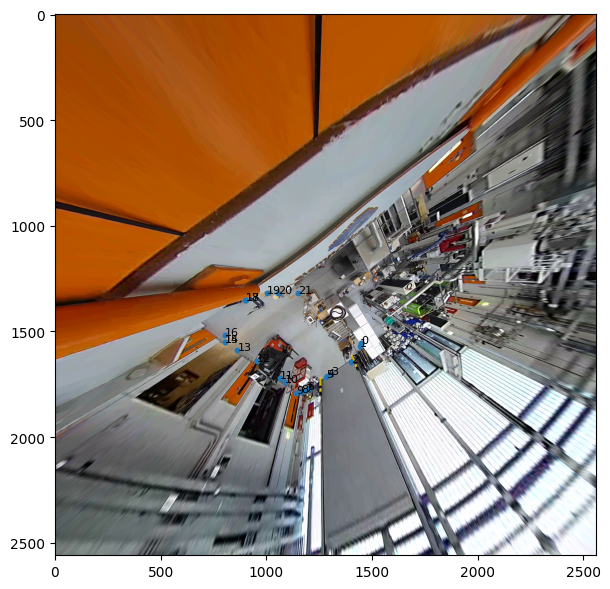

In [83]:
img_229 = cv2.cvtColor(cv2.imread("229_fov/fov_160.jpg"), cv2.COLOR_BGR2RGB)
img_233 = cv2.cvtColor(cv2.imread("cam_4/cam_233_undistort.png"), cv2.COLOR_BGR2RGB)
img_234 = cv2.cvtColor(cv2.imread("cam_4/cam_234_undistort.png"), cv2.COLOR_BGR2RGB)
img_231 = cv2.cvtColor(cv2.imread("cam_4/cam_231_undistort.png"), cv2.COLOR_BGR2RGB)

x = u_consider[:, 0]
y = u_consider[:, 1]

plt.figure(figsize=(8, 6))
plt.imshow(img_233)
plt.scatter(x, y, s=10)

# point numbers
for i, (xi, yi) in enumerate(zip(x, y)):
    plt.text(xi, yi, str(i), fontsize=8)

plt.gca().set_aspect('equal')
plt.tight_layout()
plt.show()


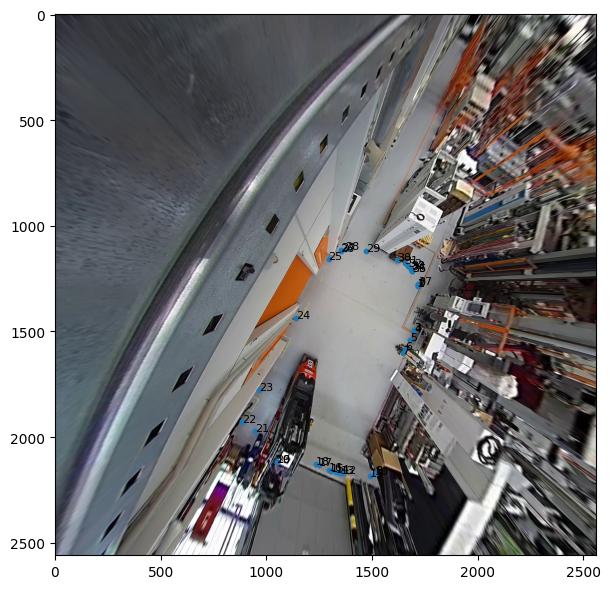

In [86]:
img_229 = cv2.cvtColor(cv2.imread("229_fov/fov_160.jpg"), cv2.COLOR_BGR2RGB)
img_233 = cv2.cvtColor(cv2.imread("cam_4/cam_233_undistort.png"), cv2.COLOR_BGR2RGB)
img_234 = cv2.cvtColor(cv2.imread("cam_4/cam_234_undistort.png"), cv2.COLOR_BGR2RGB)
img_231 = cv2.cvtColor(cv2.imread("cam_4/cam_231_undistort.png"), cv2.COLOR_BGR2RGB)

x = u_consider[:, 0]
y = u_consider[:, 1]

plt.figure(figsize=(8, 6))
plt.imshow(img_229)
plt.scatter(x, y, s=10)

# point numbers
for i, (xi, yi) in enumerate(zip(x, y)):
    plt.text(xi, yi, str(i), fontsize=8)

plt.gca().set_aspect('equal')
plt.tight_layout()
plt.show()


In [ ]:
array([0.6055837 , 0.65250635, 0.72586447, 1.2502474 , 1.2260084 ,
       1.2652653 , 1.0946908 , 1.0794184 , 0.84912294, 0.82051283,
       0.7898616 , 0.69805413, 0.65418214, 0.69425106, 0.6954398 ,
       0.7666972 , 0.7111114 , 0.75461257, 0.68057257, 1.0568675 ,
       1.052991  , 0.8458781 , 0.8506568 , 0.73437834, 0.82769716,
       1.7818933 , 0.6645422 , 0.59825814, 0.66643226, 0.7246805 ,
       0.86720866, 1.0326799 , 1.0469644 , 1.044335  , 1.0776408 ,
       1.0452261 , 1.044719  , 0.610641  ], dtype=float32)

In [85]:
area_pts

array([ 7486.626 ,  7944.75  ,  9263.4375, 19967.252 , 19638.283 ,
       19730.252 , 14273.4375, 13638.63  ,  4310.6255,  4099.875 ,
        3946.7195,  3075.3757,  2914.7493,  3136.8765,  3221.6277,
        3710.003 ,  3610.0015,  4255.314 ,  3973.125 ,  2397.124 ,
        2502.499 ,  4115.25  ,  4138.4985,  6173.623 , 35465.996 ,
       26304.754 , 25561.627 , 23012.008 , 21011.57  , 32531.643 ,
        7380.    ,  6043.501 ,  5541.124 ,  6051.9375,  6214.2197,
        5820.75  ,  6024.376 ,  7498.3115], dtype=float32)

In [46]:
pair

[('cam_229', 'cam_233'),
 ('cam_229', 'cam_234'),
 ('cam_229', 'cam_231'),
 ('cam_233', 'cam_234'),
 ('cam_233', 'cam_231'),
 ('cam_234', 'cam_231')]

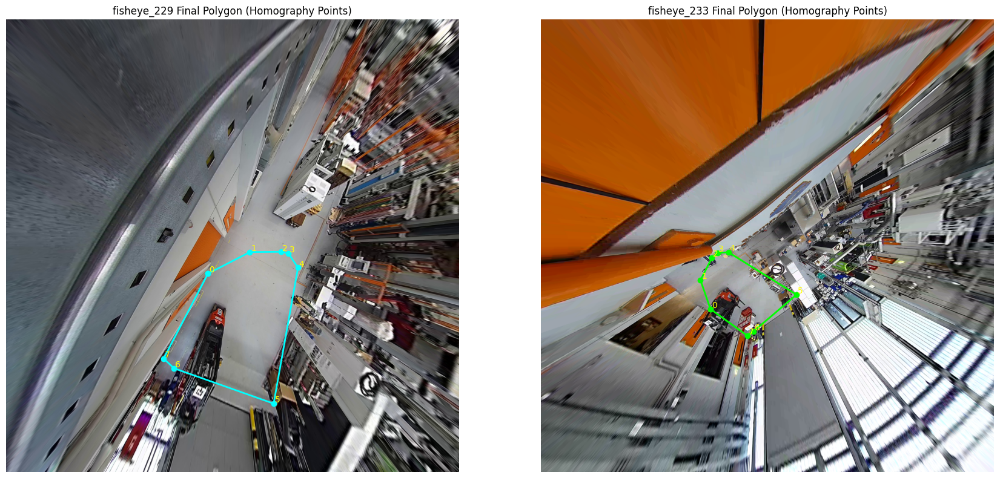

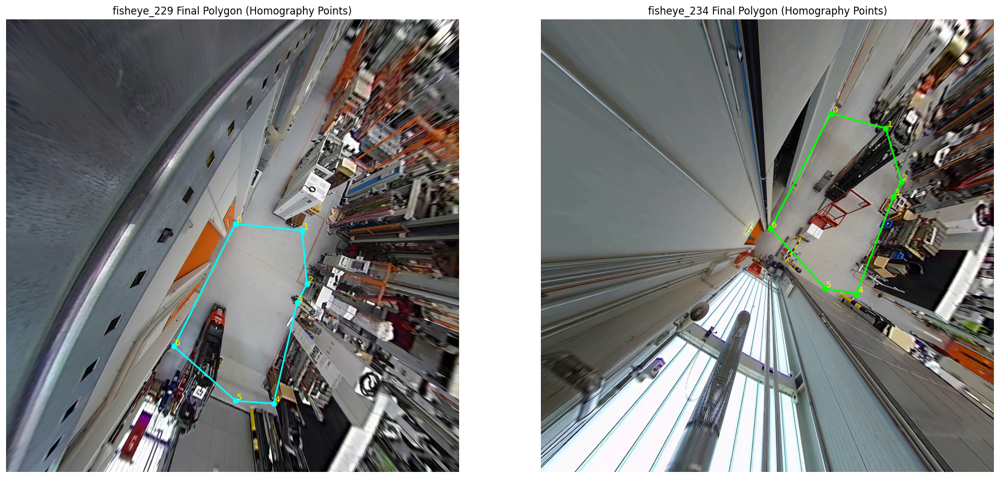

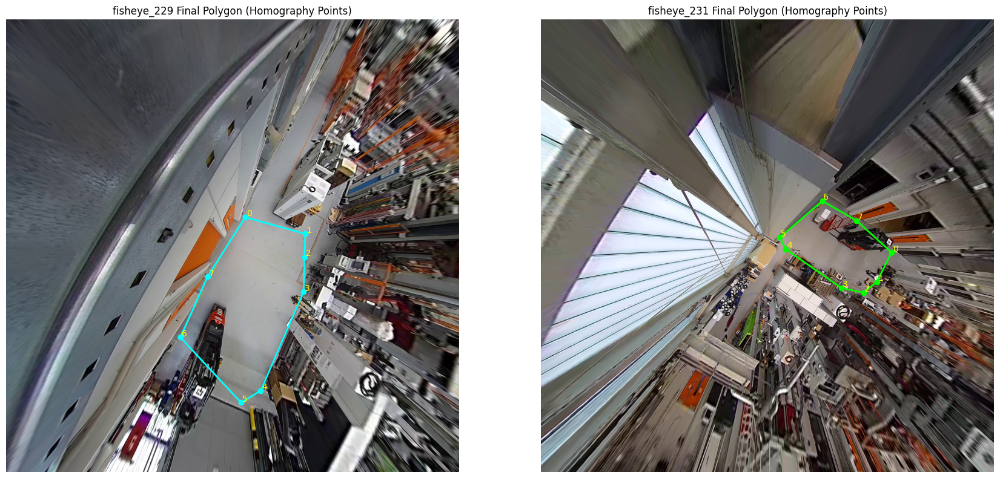

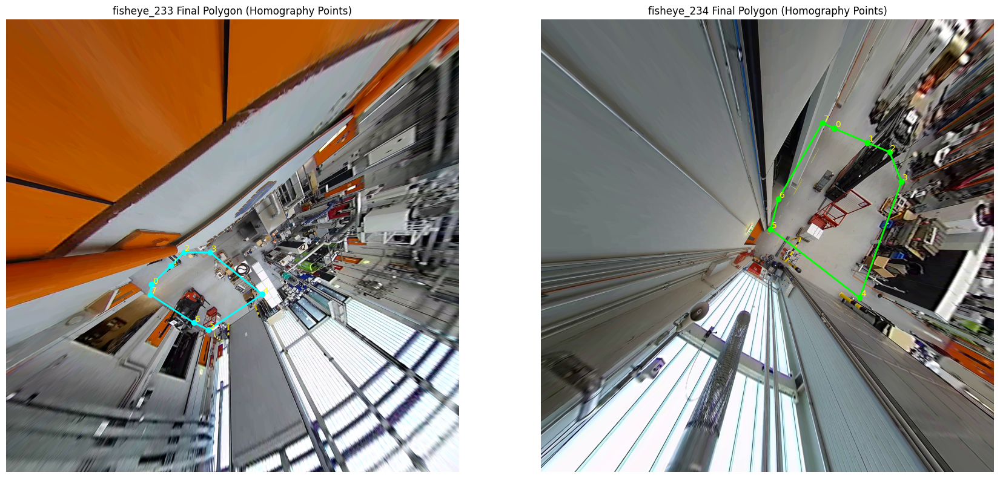

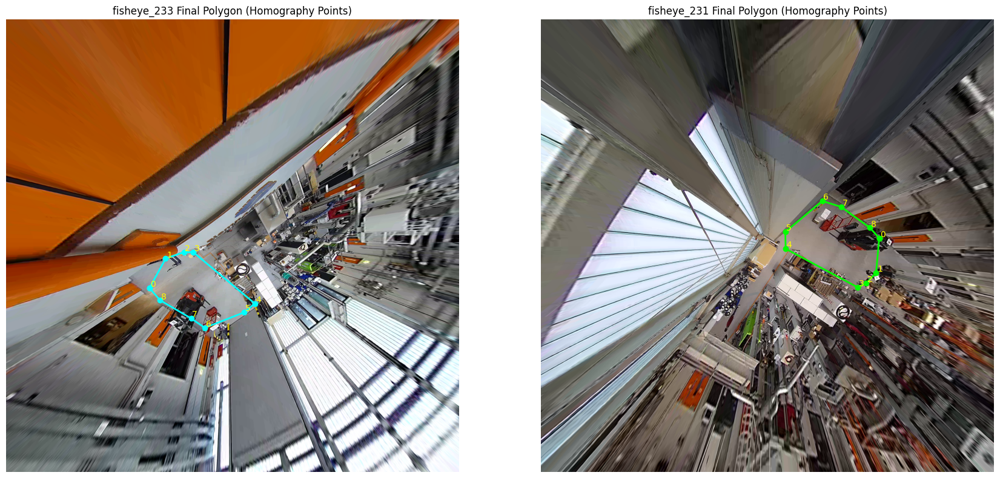

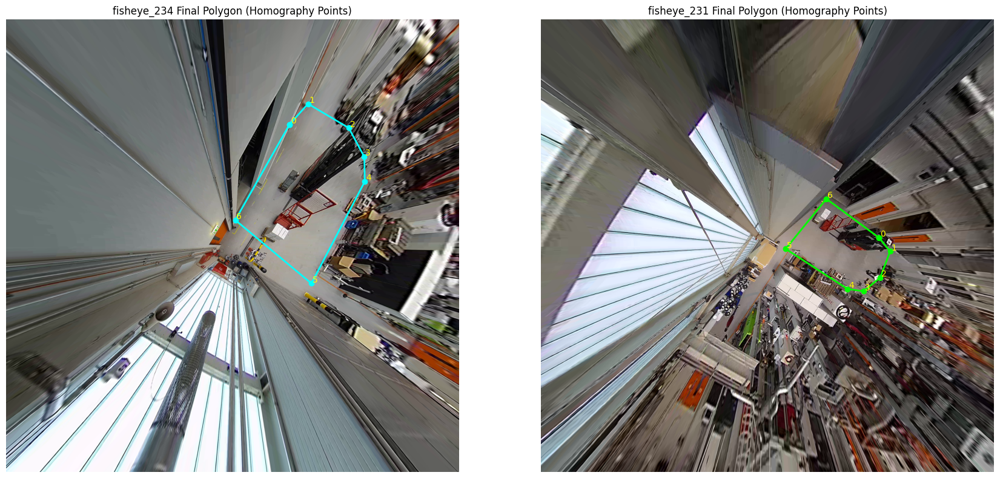

In [147]:

img_229 = cv2.cvtColor(cv2.imread("229_fov/fov_160.jpg"), cv2.COLOR_BGR2RGB)
img_233 = cv2.cvtColor(cv2.imread("cam_4/cam_233_undistort.png"), cv2.COLOR_BGR2RGB)
img_234 = cv2.cvtColor(cv2.imread("cam_4/cam_234_undistort.png"), cv2.COLOR_BGR2RGB)
img_231 = cv2.cvtColor(cv2.imread("cam_4/cam_231_undistort.png"), cv2.COLOR_BGR2RGB)
img_map = {
    "229": img_229,
    "233": img_233,
    "234": img_234,
    "231": img_231
}

def plot_polygon_on_image(ax, img, pts, title, color):
    ax.imshow(img)
    closed = np.vstack([pts, pts[0]])
    ax.plot(
        closed[:, 0],
        closed[:, 1],
        "-o",
        color=color,
        linewidth=2,
        markersize=6
    )

    for i, (x, y) in enumerate(pts):
        ax.text(x + 6, y - 6, str(i), color="yellow", fontsize=10)

    ax.set_title(title)
    ax.axis("off")

for p,val in undistorted_pair_points.items():
    _,a,b = p.split("_")
    fig, axs = plt.subplots(1, 2, figsize=(18, 8))
    plot_polygon_on_image(axs[0],img_map[a], val[0],f"fisheye_{a} Final Polygon (Homography Points)",color="cyan")
    plot_polygon_on_image(axs[1],img_map[b], val[1],f"fisheye_{b} Final Polygon (Homography Points)",color="lime")

    plt.tight_layout()
    plt.show()


In [ ]:
for p,val_ in undistorted_pair_points.items():
    _,a,b = p.split("_")
    if a == "229":
        src_pts = np.array(val_[0],np.float32)
        dst_pts = np.array(val_[1],np.float32)
        print(src_pts.shape,dst_pts.shape)

(7, 2) (7, 2)
(7, 2) (7, 2)
(7, 2) (7, 2)


In [124]:
def polygon_area(pts):
    pts = np.asarray(pts, np.float32)
    x, y = pts[:,0], pts[:,1]
    return 0.5 * abs(np.dot(x, np.roll(y, -1)) - np.dot(y, np.roll(x, -1)))

# Build adjacency + overlap

adj = defaultdict(set)
pair_area = {}

for key, (pa, pb) in undistorted_pair_points.items():
    _, a, b = key.split("_")
    A = polygon_area(pa)
    B = polygon_area(pb)
    ov = min(A, B)
    adj[a].add(b)
    adj[b].add(a)
    pair_area[(a,b)] = ov
    pair_area[(b,a)] = ov

# Anchor selection
anchors = []
covered = set()
ordered = sorted(adj.keys(), key=lambda c: len(adj[c]), reverse=True)
while len(covered) < len(adj):
    candidates = [
        c for c in ordered
        if c not in covered and len(adj[c]) > 1
    ]
    if not candidates:
        break
    anchor = candidates[0]
    anchors.append(anchor)
    covered.add(anchor)
    covered |= adj[anchor]

# Assignment
assignment = {}

for cam in adj:
    if cam in anchors:
        continue

    possible = [a for a in anchors if cam in adj[a]]
    

    if possible:
        assignment[cam] = max(
            possible,
            key=lambda a: pair_area[(cam, a)]
        )
    else:
        new_anchor = max(
            adj[cam],
            key=lambda n: pair_area[(cam, n)]
        )
        anchors.append(new_anchor)
        assignment[new_anchor] = new_anchor
        assignment[cam] = new_anchor

assignment


{'233': '229', '234': '229', '231': '229'}

In [125]:
print(possible)

['229']


In [149]:
undistorted_pair_points

{'pair_229_233': [[[1140.98583984375, 1437.0679931640625],
   [1377.64794921875, 1315.4267578125],
   [1555.3388671875, 1314.0736083984375],
   [1595.573486328125, 1322.4599609375],
   [1649.86376953125, 1403.2452392578125],
   [1512.1776123046875, 2172.6904296875],
   [949.0991821289062, 1972.942626953125],
   [890.07568359375, 1917.741943359375]],
  [[956.6950073242188, 1637.942626953125],
   [900.144775390625, 1474.214599609375],
   [965.04345703125, 1347.377685546875],
   [996.1019287109375, 1320.037353515625],
   [1058.15771484375, 1316.1666259765625],
   [1443.0098876953125, 1556.4644775390625],
   [1199.6025390625, 1764.015869140625],
   [1164.878662109375, 1788.2275390625]]],
 'pair_229_234': [[[1295.7725830078125, 1155.8724365234375],
   [1673.0606689453125, 1193.0216064453125],
   [1700.528076171875, 1495.482421875],
   [1645.1456298828125, 1601.97802734375],
   [1512.1776123046875, 2172.6904296875],
   [1297.8170166015625, 2156.931884765625],
   [948.8974609375, 1848.9957275

In [155]:
homography = {}
for p,val_ in undistorted_pair_points.items():
    _,a,b = p.split("_")
    src_pts = np.array(val_[1],np.float32)
    dst_pts = np.array(val_[0],np.float32)
    h_relative,mask = cv2.findHomography(src_pts,dst_pts,cv2.RANSAC)
    homography[f"homo_dst_{a}_src_{b}"] = h_relative
homography

{'homo_dst_229_src_233': array([[-1.80597542e-02, -9.13221690e-01,  1.74520280e+03],
        [-1.11362108e-02, -4.41179319e-01,  1.02567129e+03],
        [-1.38938921e-04, -4.05149951e-04,  1.00000000e+00]]),
 'homo_dst_229_src_234': array([[ 8.49553858e-01,  8.52689670e-02, -3.39737995e+02],
        [-2.66452306e-01,  9.39434395e-01,  9.16138844e+02],
        [-1.06112571e-04,  3.91183417e-05,  1.00000000e+00]]),
 'homo_dst_229_src_231': array([[ 3.64215803e-01,  6.32836575e-01, -1.81597488e+02],
        [-8.57666244e-01, -1.16846853e+00,  4.37422852e+03],
        [ 3.87261509e-04, -5.69746656e-04,  1.00000000e+00]]),
 'homo_dst_233_src_234': array([[-3.09509686e-02,  1.17272082e+00,  5.40962396e+01],
        [-9.26775559e-01,  8.26975416e-01,  2.34718214e+03],
        [-2.37243681e-04,  4.45417284e-04,  1.00000000e+00]]),
 'homo_dst_233_src_231': array([[-4.60245300e-01, -3.22806019e-01,  1.42011641e+03],
        [-3.01076420e-01, -7.38736438e-01,  1.79167939e+03],
        [-1.937213

In [204]:
assignment

{'233': '229', '234': '229', '231': '229'}

In [126]:
ref_homography = {"229":"cam_229_homo.npy"} 
homography = {}
ref = [k for k,v in ref_homography.items()]
for p,val in undistorted_pair_points.items():
    print(p)
    calculate_homography = False
    _,a,b = p.split("_")
    print(a,b)
    if a in ref:
        src_pts = np.array(val[1],np.float32)
        dst_pts = np.array(val[0],np.float32)
        key = f"Homography_{b}"
        if b in assignment:
            ref_considered_b = assignment[b]
            if a != b:
                h_ref_cam = np.load(ref_homography[ref_considered_b])
                calculate_homography = True
                ref_cam = a
    elif b in ref:
        src_pts = np.array(val[0],np.float32)
        dst_pts = np.array(val[1],np.float32)
        key = f"Homography_{a}"
        if a in assignment:
            ref_considered_a = assignment[a]
            if b != a:
                h_ref_cam = np.load(ref_homography[ref_considered_a])
                calculate_homography = True
                ref_cam = b
    else:
        continue
    
    if calculate_homography:
        h_relative,mask = cv2.findHomography(src_pts,dst_pts,cv2.RANSAC)
        h_cam_to_bev = h_ref_cam @ h_relative
        if homography.get(ref_cam) is None:
            homography[f"Homography_{ref_cam}"] = h_ref_cam
        if homography.get(key) is None:
            homography[key] = h_cam_to_bev
        else:
            continue
    else:
        continue



pair_229_233
229 233
pair_229_234
229 234
pair_229_231
229 231
pair_233_234
233 234
pair_233_231
233 231
pair_234_231
234 231


In [127]:
homography

{'Homography_229': array([[-2.43229184e-01,  2.93317061e-01,  1.19626407e+03],
        [-3.24129531e-01, -6.24119645e-02,  1.18698319e+03],
        [-1.10512320e-04,  8.79198669e-05,  1.00000000e+00]]),
 'Homography_233': array([[-2.99536463e-01, -3.94925538e-01,  1.14291321e+03],
        [-1.63497270e-01, -1.62328325e-01,  5.25056501e+02],
        [-2.44265468e-04, -3.19422792e-04,  9.16649061e-01]]),
 'Homography_234': array([[-4.08795113e-01,  2.82851365e-01,  1.54918220e+03],
        [-3.82226700e-01, -4.84798433e-02,  1.23846547e+03],
        [-2.21444134e-04,  9.98974847e-05,  1.11844843e+00]]),
 'Homography_231': array([[-5.72200385e-01, -5.76322508e-01,  1.40474907e+03],
        [-2.53155505e-01, -2.14153657e-01,  5.73493084e+02],
        [-4.10889232e-04, -4.09605245e-04,  1.00555251e+00]])}

In [8]:
assignment

{'233': '229', '234': '229'}